# Data Preprocessing Pipeline

Walks through each stage of `preprocess_patches.py` on a single image,
with full-resolution visualisation at every step.

**Pipeline:**
1. Load raw volume (C, Z, Y, X)
2. Maximum Intensity Projection along Z → (C, Y, X)
3. Per-channel percentile normalisation → [0, 1]
4. Tiling into patches
5. PatchDataset data loader test
6. Verify patches (reassemble saved patches & compare with raw MIP)

---
## 0 — Imports & helpers

In [1]:
%matplotlib inline

import sys
sys.path.insert(0, '../..')

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

from data_utils.preprocess_patches import (
    load_image,
    maximum_intensity_projection,
    best_z_slice,
    normalize_percentile,
    extract_patches,
)

print('Imports OK')

Imports OK


In [2]:
# ── Visualisation helpers ────────────────────────────────────────────

def _black_to(rgb):
    """Colormap from black to the given RGB colour."""
    return LinearSegmentedColormap.from_list('', [(0, 0, 0), rgb])

CHANNEL_CMAPS = [
    _black_to((1, 0, 0)),   # ch0 — red
    _black_to((0, 1, 0)),   # ch1 — green
    _black_to((0, 0, 1)),   # ch2 — blue
]


def show_channels(image, title='', vmax_pct=99.5):
    """
    Show each channel of a (C, H, W) image side by side.

    Parameters
    ----------
    image : np.ndarray, shape (C, H, W)
    title : str, super-title
    vmax_pct : float, percentile used for display clipping
    """
    C = image.shape[0]
    fig, axes = plt.subplots(1, C, figsize=(6 * C, 6))
    if C == 1:
        axes = [axes]
    for c, ax in enumerate(axes):
        ch = image[c]
        vmax = np.percentile(ch, vmax_pct) if ch.max() > 0 else 1
        cmap = CHANNEL_CMAPS[c % len(CHANNEL_CMAPS)]
        ax.imshow(ch, cmap=cmap, vmin=0, vmax=vmax)
        ax.set_title(f'Ch {c}  min={ch.min():.3g}  max={ch.max():.3g}')
        ax.axis('off')
    if title:
        fig.suptitle(title, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

---
## 1 — Load raw volume

In [3]:
# ── Point this at any raw microscopy file ──
IMAGE_PATH = '/run/media/anokhver/Data/Veronika/ctu/Microscopy/Microscopy/20251030/2_3_PSYHARMIN_2_Multichannel Z-Stack_20251030_67.vsi'
#IMAGE_PATH = '/run/media/anokhver/Data/Veronika/ctu/Microscopy/Microscopy/20251030/1_8_KONTROLA_1_Multichannel Z-Stack_20251030_118.vsi'

from pathlib import Path
volume = load_image(Path(IMAGE_PATH))   # (C, Z, Y, X)
C, Z, H, W = volume.shape
print(f'Raw volume: C={C}, Z={Z}, H={H}, W={W}, dtype={volume.dtype}')

2026-03-30 19:34:09 [INFO] Fetching Maven using cjdk...

SLF4J: No SLF4J providers were found.
SLF4J: Defaulting to no-operation (NOP) logger implementation
SLF4J: See https://www.slf4j.org/codes.html#noProviders for further details.
2026-03-30 19:34:24 [INFO]   Loaded via aicsimageio: shape=(3, 31, 2304, 2304), dtype=uint16


Raw volume: C=3, Z=31, H=2304, W=2304, dtype=uint16


Middle z-slice: 15,  brightest z-slice: 18


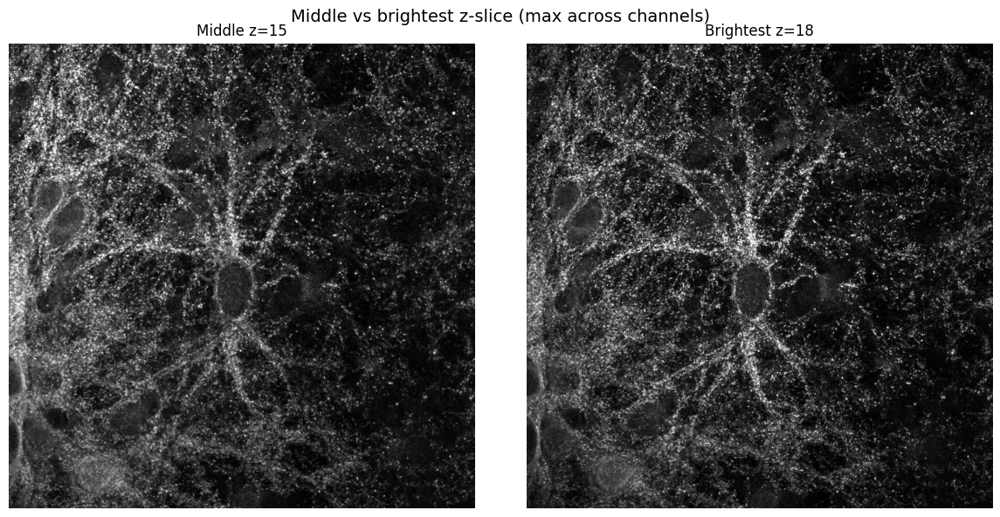

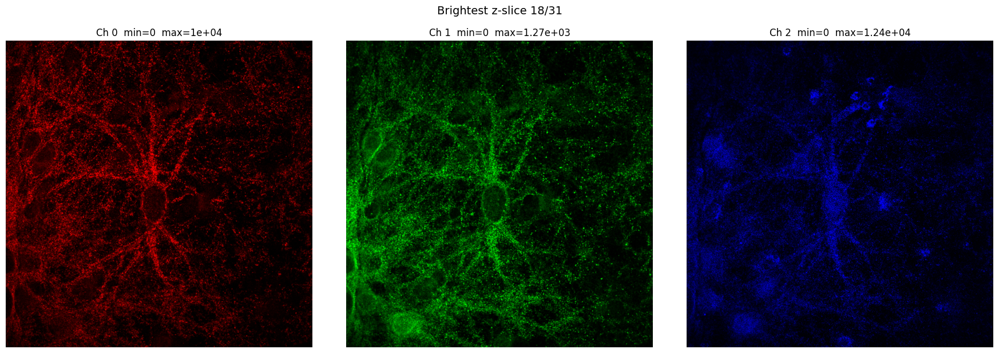

In [4]:
best_z = best_z_slice(volume)
mid_z = Z // 2
print(f'Middle z-slice: {mid_z},  brightest z-slice: {best_z}')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
for ax, z_idx, label in [(axes[0], mid_z, 'Middle'), (axes[1], best_z, 'Brightest')]:
    # composite: max across channels for a quick overview
    composite = volume[:, z_idx, :, :].astype(np.float32).max(axis=0)
    vmax = np.percentile(composite, 99.5) if composite.max() > 0 else 1
    ax.imshow(composite, cmap='gray', vmin=0, vmax=vmax)
    ax.set_title(f'{label} z={z_idx}')
    ax.axis('off')
plt.suptitle('Middle vs brightest z-slice (max across channels)', fontsize=14)
plt.tight_layout()
plt.show()
plt.close(fig)

# Show per-channel detail for the brightest slice
show_channels(volume[:, best_z, :, :].astype(np.float32),
              title=f'Brightest z-slice {best_z}/{Z}')

---
## 2 — Maximum Intensity Projection (MIP)

MIP shape: (3, 2304, 2304), dtype=float32


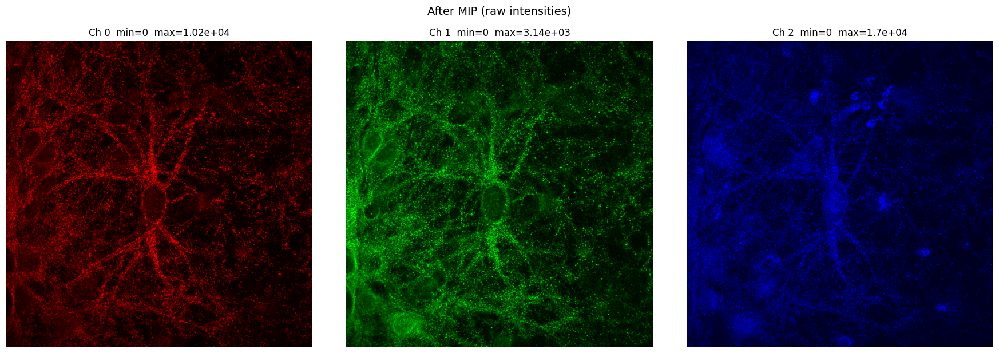

In [5]:
mip = maximum_intensity_projection(volume)   # (C, Y, X) float32
print(f'MIP shape: {mip.shape}, dtype={mip.dtype}')

# Free the large volume — we no longer need it
del volume

show_channels(mip, title='After MIP (raw intensities)')

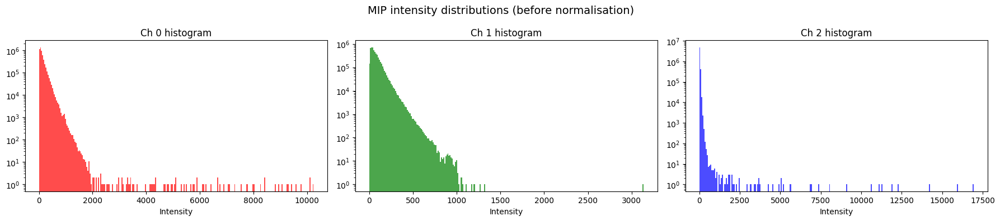

In [6]:
# Per-channel intensity histograms before normalisation
fig, axes = plt.subplots(1, mip.shape[0], figsize=(6 * mip.shape[0], 4))
if mip.shape[0] == 1:
    axes = [axes]
for c, ax in enumerate(axes):
    vals = mip[c].ravel()
    ax.hist(vals, bins=256, color=['r', 'g', 'b'][c % 3], alpha=0.7)
    ax.set_title(f'Ch {c} histogram')
    ax.set_yscale('log')
    ax.set_xlabel('Intensity')
fig.suptitle('MIP intensity distributions (before normalisation)', fontsize=14)
plt.tight_layout()
plt.show()
plt.close(fig)

---
## 3 — Per-channel percentile normalisation

In [7]:
# ── Tweak these to experiment ──
PLOW  = 1.0
PHIGH = 99.8

mip_norm = normalize_percentile(mip, plow=PLOW, phigh=PHIGH)
print(f'Normalised range per channel:')
for c in range(mip_norm.shape[0]):
    print(f'  Ch {c}: [{mip_norm[c].min():.4f}, {mip_norm[c].max():.4f}]')

Normalised range per channel:
  Ch 0: [0.0000, 1.0000]
  Ch 1: [0.0000, 1.0000]
  Ch 2: [0.0000, 1.0000]


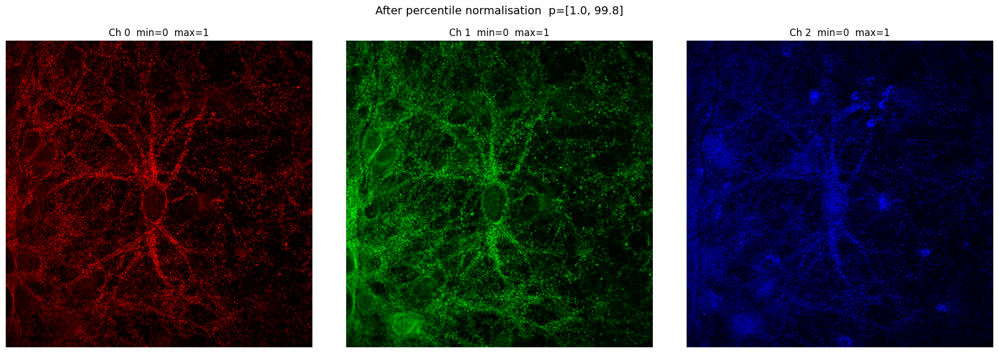

In [8]:
show_channels(mip_norm, title=f'After percentile normalisation  p=[{PLOW}, {PHIGH}]')

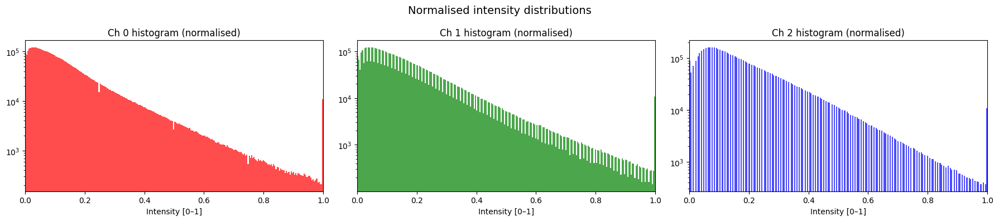

In [9]:
# Per-channel histograms after normalisation
fig, axes = plt.subplots(1, mip_norm.shape[0], figsize=(6 * mip_norm.shape[0], 4))
if mip_norm.shape[0] == 1:
    axes = [axes]
for c, ax in enumerate(axes):
    vals = mip_norm[c].ravel()
    ax.hist(vals, bins=256, color=['r', 'g', 'b'][c % 3], alpha=0.7)
    ax.set_title(f'Ch {c} histogram (normalised)')
    ax.set_yscale('log')
    ax.set_xlim(0, 1)
    ax.set_xlabel('Intensity [0–1]')
fig.suptitle('Normalised intensity distributions', fontsize=14)
plt.tight_layout()
plt.show()
plt.close(fig)

---
## 4 — Tiling into patches

In [10]:
# ── Tweak these to experiment ──
PATCH_SIZE = 128

patches = extract_patches(mip_norm, patch_size=PATCH_SIZE)
n_total = patches.shape[0]

C_img, H_img, W_img = mip_norm.shape
n_rows = H_img // PATCH_SIZE
n_cols = W_img // PATCH_SIZE

print(f'Patches: {patches.shape}  ({n_rows} rows × {n_cols} cols = {n_total})')

Patches: (324, 3, 128, 128)  (18 rows × 18 cols = 324)


---
## 5 — PatchDataset data loader test

Verify that `PatchDataset` loads patches correctly: shapes, dtypes,
value ranges, channel selection, and DataLoader batching.

In [11]:
from data_utils.patch_dataset import PatchDataset
from torch.utils.data import DataLoader

PATCHES_DIR = '../../data/patches'

# --- Basic properties ---
ds = PatchDataset(PATCHES_DIR)
print(f'Dataset length:    {len(ds)}')
print(f'Num channels:      {ds.num_channels}')
print(f'Patch size:        {ds.patch_size}')

sample = ds[0]
print(f'Sample type:       {type(sample)}')
print(f'Sample dtype:      {sample.dtype}')
print(f'Sample shape:      {sample.shape}')
print(f'Value range:       [{sample.min():.4f}, {sample.max():.4f}]')

assert sample.shape == (ds.num_channels, ds.patch_size, ds.patch_size), \
    f'Shape mismatch: {sample.shape}'
assert sample.min() >= 0.0, f'Negative values: min={sample.min()}'
assert sample.max() <= 1.0, f'Values > 1: max={sample.max()}'
print('\n✓ Basic properties OK')

Dataset length:    22032
Num channels:      3
Patch size:        128
Sample type:       <class 'torch.Tensor'>
Sample dtype:      torch.float32
Sample shape:      torch.Size([3, 128, 128])
Value range:       [0.0000, 0.4654]

✓ Basic properties OK


In [12]:
# --- Channel selection ---
ds_ch0 = PatchDataset(PATCHES_DIR, channels=[0])
ds_ch01 = PatchDataset(PATCHES_DIR, channels=[0, 1])

s0 = ds_ch0[0]
s01 = ds_ch01[0]
print(f'channels=[0]    → shape {s0.shape},  num_channels={ds_ch0.num_channels}')
print(f'channels=[0,1]  → shape {s01.shape}, num_channels={ds_ch01.num_channels}')

assert s0.shape == (1, ds.patch_size, ds.patch_size)
assert s01.shape == (2, ds.patch_size, ds.patch_size)
# channel 0 from both should match
assert (s0[0] == s01[0]).all(), 'Channel 0 mismatch between subsets'
print('✓ Channel selection OK')

channels=[0]    → shape torch.Size([1, 128, 128]),  num_channels=1
channels=[0,1]  → shape torch.Size([2, 128, 128]), num_channels=2
✓ Channel selection OK


In [13]:
# --- DataLoader batching ---
loader = DataLoader(ds, batch_size=16, shuffle=True, num_workers=0)
batch = next(iter(loader))
print(f'Batch shape: {batch.shape}')
print(f'Batch dtype: {batch.dtype}')
assert batch.shape == (16, ds.num_channels, ds.patch_size, ds.patch_size)
assert batch.dtype == sample.dtype
print('✓ DataLoader batching OK')

Batch shape: torch.Size([16, 3, 128, 128])
Batch dtype: torch.float32
✓ DataLoader batching OK


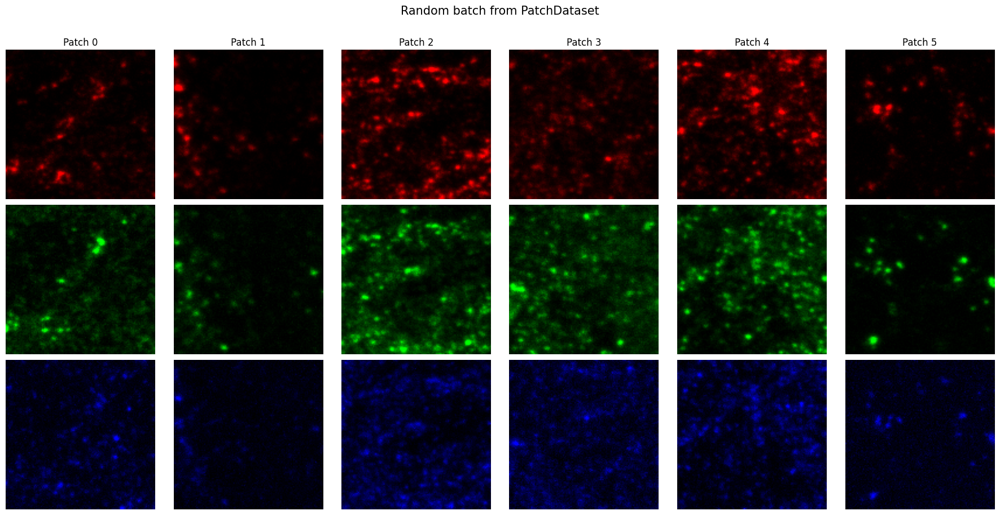

In [14]:
# --- Visualise a few random patches from the DataLoader ---
fig, axes = plt.subplots(3, 6, figsize=(18, 9))

for c in range(3):
    for i in range(6):
        ax = axes[c, i]
        cmap = CHANNEL_CMAPS[c % len(CHANNEL_CMAPS)]
        ax.imshow(batch[i, c].numpy(), cmap=cmap, vmin=0, vmax=1)
        ax.axis('off')
        if c == 0:
            ax.set_title(f'Patch {i}')
    axes[c, 0].set_ylabel(f'Ch {c}', fontsize=12, rotation=0, labelpad=30)

fig.suptitle('Random batch from PatchDataset', fontsize=15, y=1.01)
plt.tight_layout()
plt.show()
plt.close(fig)

---
## 6 — Verify patches (reassemble & compare)

Load the raw image (MIP, no normalisation) and reassemble the saved
preprocessed patches side-by-side to confirm the pipeline transformed
the data correctly and the tiling is consistent.

In [15]:
import csv
from collections import defaultdict

PATCHES_DIR = Path('../../data/patches')
RAW_IMAGE_DIR = Path('/run/media/anokhver/Data/Veronika/ctu/Microscopy/Microscopy/20251030')

# Which source images to verify (by image_index in index.csv)
IMAGES_TO_CHECK = [1, 8]

# Load the index
with open(PATCHES_DIR / 'index.csv', 'r') as f:
    reader = csv.DictReader(f)
    records = list(reader)

print(f'Total records in index: {len(records)}')

by_image = defaultdict(list)
for rec in records:
    by_image[int(rec['image_index'])].append(rec)

print(f'Unique source images: {len(by_image)}')
for idx in IMAGES_TO_CHECK:
    recs = by_image[idx]
    print(f'  Image {idx}: {recs[0]["source_image"]} — {len(recs)} patches')

Total records in index: 22032
Unique source images: 68
  Image 1: 2_2_PSI_3010_Multichannel Z-Stack_20251030_51.vsi — 324 patches
  Image 8: 2_3_PSYHARMIN_2_Multichannel Z-Stack_20251030_67.vsi — 324 patches



=== Image 1: 2_2_PSI_3010_Multichannel Z-Stack_20251030_51.vsi ===


2026-03-30 19:37:16 [INFO]   Loaded via aicsimageio: shape=(3, 28, 2304, 2304), dtype=uint16


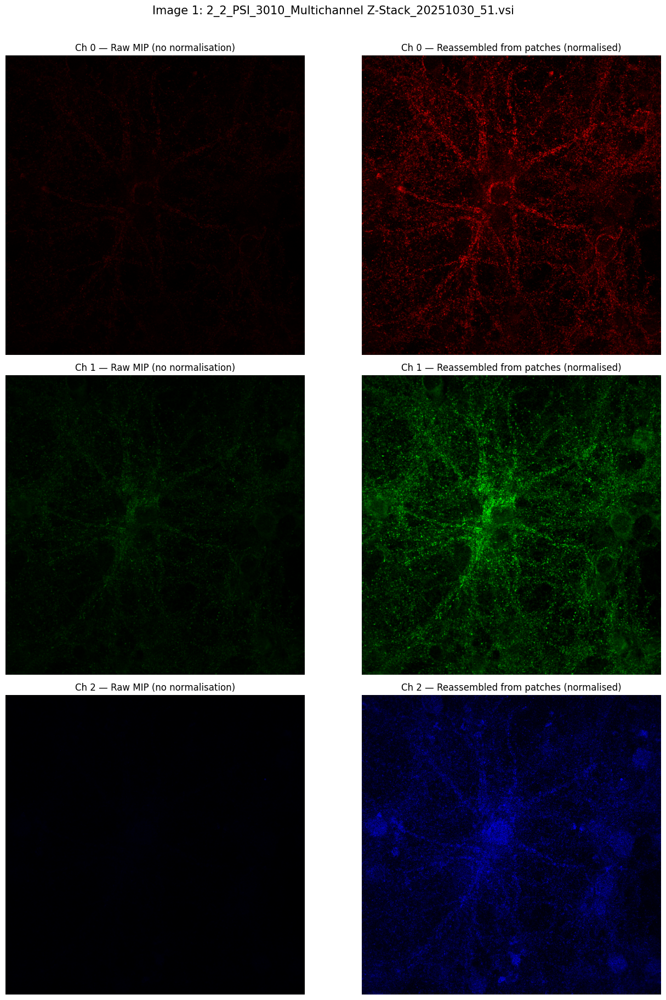


=== Image 8: 2_3_PSYHARMIN_2_Multichannel Z-Stack_20251030_67.vsi ===


2026-03-30 19:37:32 [INFO]   Loaded via aicsimageio: shape=(3, 31, 2304, 2304), dtype=uint16


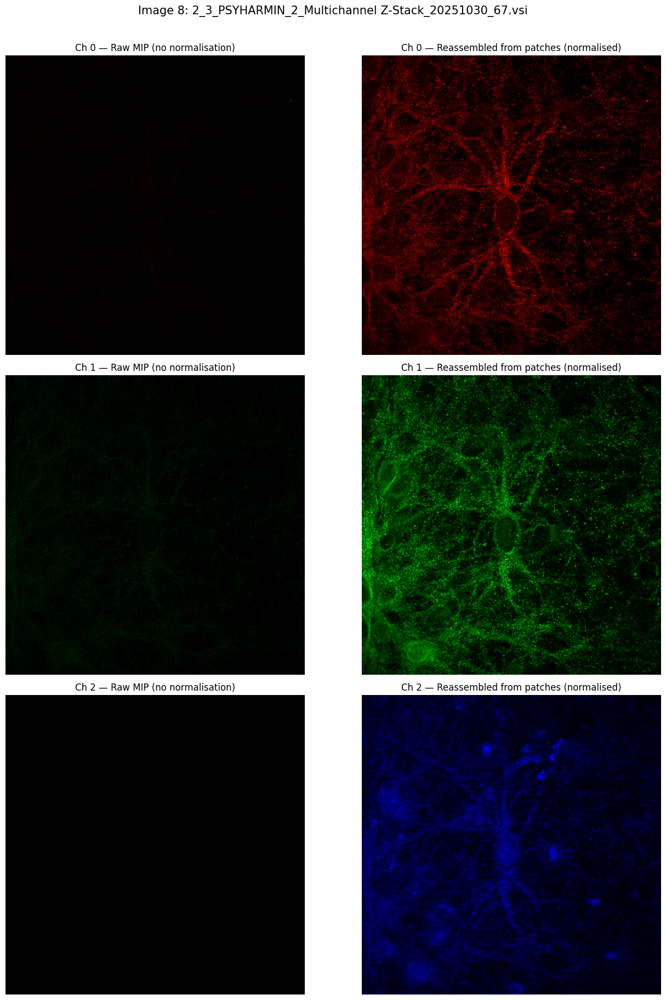


✓ Patch verification OK


In [16]:
def reassemble_from_patches(records, patches_dir, patch_size, n_rows, n_cols):
    """
    Stitch saved .npy patches back into a full (C, H, W) image
    using grid_row / grid_col from index.csv.
    Missing patches are filled with NaN.
    """
    sample = np.load(patches_dir / records[0]['filename'])
    C = sample.shape[0]

    H = n_rows * patch_size
    W = n_cols * patch_size
    canvas = np.full((C, H, W), np.nan, dtype=np.float32)

    for rec in records:
        r = int(rec['grid_row'])
        c = int(rec['grid_col'])
        patch = np.load(patches_dir / rec['filename'])
        y0 = r * patch_size
        x0 = c * patch_size
        canvas[:, y0:y0 + patch_size, x0:x0 + patch_size] = patch

    return canvas


for img_idx in IMAGES_TO_CHECK:
    recs = by_image[img_idx]
    source_name = recs[0]['source_image']
    patch_size = int(recs[0]['patch_size'])
    C = int(recs[0]['channels'])

    print(f'\n=== Image {img_idx}: {source_name} ===')
    volume = load_image(RAW_IMAGE_DIR / source_name)
    mip_raw = maximum_intensity_projection(volume)
    del volume

    _, H, W = mip_raw.shape
    n_rows = H // patch_size
    n_cols = W // patch_size
    mip_raw = mip_raw[:, :n_rows * patch_size, :n_cols * patch_size]

    reassembled = reassemble_from_patches(recs, PATCHES_DIR, patch_size, n_rows, n_cols)

    # --- Compare per channel ---
    fig, axes = plt.subplots(C, 2, figsize=(14, 6 * C))
    if C == 1:
        axes = axes.reshape(1, 2)

    for c in range(C):
        cmap = CHANNEL_CMAPS[c % len(CHANNEL_CMAPS)]

        ch_raw = mip_raw[c]
        axes[c, 0].imshow(ch_raw, cmap=cmap, vmin=ch_raw.min(), vmax=ch_raw.max())
        axes[c, 0].set_title(f'Ch {c} — Raw MIP (no normalisation)')
        axes[c, 0].axis('off')

        cmap_nan = cmap.copy()
        cmap_nan.set_bad(color='white')
        axes[c, 1].imshow(reassembled[c], cmap=cmap_nan, vmin=0, vmax=1)
        axes[c, 1].set_title(f'Ch {c} — Reassembled from patches (normalised)')
        axes[c, 1].axis('off')

    fig.suptitle(f'Image {img_idx}: {source_name}', fontsize=15, y=1.01)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

    del mip_raw, reassembled

print('\n✓ Patch verification OK')